# Libraries

In [1]:
import os
import cv2

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import glob
import shutil
import os
import random
from PIL import Image

import albumentations as album # for augmentation
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

%matplotlib inline

In [2]:
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null
import segmentation_models_pytorch as smp

# Constants

## Dataset

In [3]:
!wget https://thor.robots.ox.ac.uk/~vgg/data/pets/images.tar.gz

--2022-12-19 17:07:57--  https://thor.robots.ox.ac.uk/~vgg/data/pets/images.tar.gz
Resolving thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)... 129.67.95.98
Connecting to thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)|129.67.95.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 791918971 (755M) [application/octet-stream]
Saving to: ‘images.tar.gz’

images.tar.gz       100%[===================>] 755.23M   188MB/s    in 4.3s    

2022-12-19 17:08:02 (176 MB/s) - ‘images.tar.gz’ saved [791918971/791918971]



In [4]:
!wget https://thor.robots.ox.ac.uk/~vgg/data/pets/annotations.tar.gz


--2022-12-19 17:08:02--  https://thor.robots.ox.ac.uk/~vgg/data/pets/annotations.tar.gz
Resolving thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)... 129.67.95.98
Connecting to thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)|129.67.95.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19173078 (18M) [application/octet-stream]
Saving to: ‘annotations.tar.gz’

annotations.tar.gz  100%[===================>]  18.28M  91.4MB/s    in 0.2s    

2022-12-19 17:08:02 (91.4 MB/s) - ‘annotations.tar.gz’ saved [19173078/19173078]



In [5]:
!tar vfx images.tar.gz

Streaming output truncated to the last 5000 lines.
images/american_bulldog_194.jpg
images/Birman_175.jpg
images/american_bulldog_178.jpg
images/staffordshire_bull_terrier_93.jpg
images/Egyptian_Mau_58.jpg
images/havanese_44.jpg
images/english_cocker_spaniel_97.jpg
images/Ragdoll_111.jpg
images/american_pit_bull_terrier_159.jpg
images/english_setter_134.jpg
images/english_setter_87.jpg
images/wheaten_terrier_198.jpg
images/pug_180.jpg
images/boxer_172.jpg
images/Sphynx_197.jpg
images/german_shorthaired_2.jpg
images/British_Shorthair_9.jpg
images/pug_89.jpg
images/japanese_chin_39.jpg
images/Ragdoll_20.jpg
images/american_bulldog_111.jpg
images/yorkshire_terrier_112.jpg
images/Persian_88.jpg
images/pug_9.jpg
images/Birman_40.jpg
images/British_Shorthair_272.jpg
images/havanese_7.jpg
images/pomeranian_154.jpg
images/beagle_49.jpg
images/British_Shorthair_94.jpg
images/Persian_90.jpg
images/staffordshire_bull_terrier_30.jpg
images/samoyed_113.jpg
images/english_cocker_spaniel_46.jpg
images

In [6]:
!tar vfx annotations.tar.gz

Streaming output truncated to the last 5000 lines.
annotations/trimaps/._pomeranian_180.png
annotations/trimaps/pomeranian_180.png
annotations/trimaps/._pomeranian_181.png
annotations/trimaps/pomeranian_181.png
annotations/trimaps/._pomeranian_182.png
annotations/trimaps/pomeranian_182.png
annotations/trimaps/._pomeranian_183.png
annotations/trimaps/pomeranian_183.png
annotations/trimaps/._pomeranian_184.png
annotations/trimaps/pomeranian_184.png
annotations/trimaps/._pomeranian_185.png
annotations/trimaps/pomeranian_185.png
annotations/trimaps/._pomeranian_186.png
annotations/trimaps/pomeranian_186.png
annotations/trimaps/._pomeranian_187.png
annotations/trimaps/pomeranian_187.png
annotations/trimaps/._pomeranian_188.png
annotations/trimaps/pomeranian_188.png
annotations/trimaps/._pomeranian_189.png
annotations/trimaps/pomeranian_189.png
annotations/trimaps/._pomeranian_19.png
annotations/trimaps/pomeranian_19.png
annotations/trimaps/._pomeranian_190.png
annotations/trimaps/pomeranian

In [7]:
IMG_PATH = '/content/images'
ANNOTATION_PATH = '/content/annotations/trimaps'

IMAGE_SIZE = 256
RANDOM_STATE = 7
TRAIN_SIZE, VAL_SIZE, TEST_SIZE = 0.6, 0.2, 0.2

## Model

In [8]:
BATCH_SIZE = 32
EPOCHS = 5
LEARNING_RATE = 0.001

In [9]:
patience = 5
verbose = 1
factor = 0.50
min_lr = 0.0001

In [10]:
# Unet
ENCODER = 'mobilenet_v2'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid' # None for logits or 'softmax2d' for multiclass segmentation


In [11]:
TRAINING = True

# Preprocess

## Loading Data

In [12]:
input_img_paths = []
annotation_img_paths = []

for fname in os.listdir(IMG_PATH):
    img_path = os.path.join(IMG_PATH, fname)
    ann_path = os.path.join(ANNOTATION_PATH, fname.replace(".jpg", ".png"))
    if cv2.imread(img_path) is None or cv2.imread(ann_path) is None:
        print(f"cannot not load {fname}")
        continue

    input_img_paths.append(img_path)
    annotation_img_paths.append(ann_path)

    

cannot not load Egyptian_Mau_139.jpg
cannot not load Abyssinian_100.mat
cannot not load Egyptian_Mau_145.jpg
cannot not load Egyptian_Mau_167.jpg
cannot not load Egyptian_Mau_191.jpg
cannot not load Egyptian_Mau_177.jpg
cannot not load Abyssinian_102.mat
cannot not load Abyssinian_101.mat
cannot not load Abyssinian_34.jpg


In [13]:
def split_paths(paths, train_size, val_size):
    train_n = int(len(paths)*train_size)
    val_n = int(len(paths)*val_size)
    
    train = paths[:train_n]
    val = paths[train_n:train_n + val_n]
    test = paths[train_n + val_n:]
    
    return train, val, test

In [14]:
input_img_paths, annotation_img_paths = shuffle(input_img_paths, annotation_img_paths, random_state=RANDOM_STATE)

train_img_paths, val_img_paths, test_img_paths = split_paths(input_img_paths, TRAIN_SIZE, VAL_SIZE)
train_label_paths, val_label_paths, test_label_paths = split_paths(annotation_img_paths, TRAIN_SIZE, VAL_SIZE)

In [15]:
print(f'Total images: {len(input_img_paths)}')

print(f'Training Data Path: {len(train_img_paths)}')
print(f'Training Labels Path: {len(train_label_paths)}')
print(f'\nValidation Data Path: {len(val_img_paths)}')
print(f'Validation Labels Path: {len(val_label_paths)}')
print(f'\nTesting Data Path: {len(test_img_paths)}')
print(f'Testing Labels Path: {len(test_label_paths)}')

Total images: 7384
Training Data Path: 4430
Training Labels Path: 4430

Validation Data Path: 1476
Validation Labels Path: 1476

Testing Data Path: 1478
Testing Labels Path: 1478


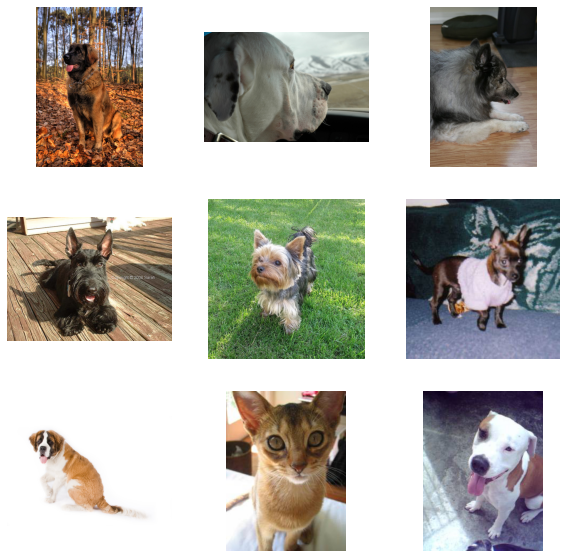

In [16]:
plt.subplots(nrows = 3, ncols = 3, figsize = (10, 10))

for i, imgIndex in enumerate(np.random.randint(0, len(train_img_paths), size = 9)):
    plt.subplot(3, 3, i + 1)
    plt.axis(False)
    plt.grid(False)
    plt.imshow(plt.imread(train_img_paths[imgIndex]))
plt.show()

## Visualize Mask

In [17]:
mask = cv2.cvtColor(cv2.imread(annotation_img_paths[1]), cv2.COLOR_BGR2RGB)
mask.shape

(281, 500, 3)

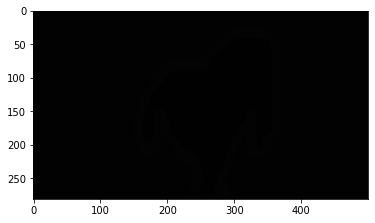

In [18]:
plt.imshow(mask[:,:,:])

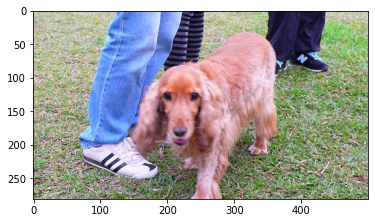

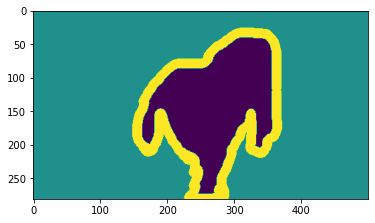

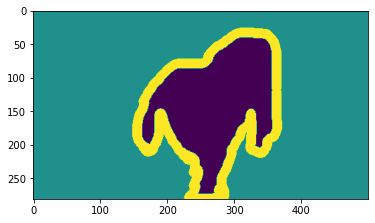

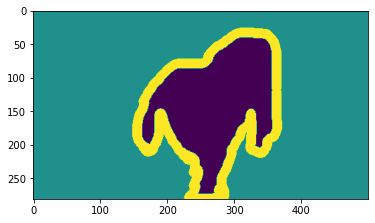

In [19]:
img = plt.imread(input_img_paths[1])
plt.figure()
plt.imshow(img)
plt.figure()
plt.imshow(mask[:,:,0])
plt.figure()
plt.imshow(mask[:,:,1])
plt.figure()
plt.imshow(mask[:,:,2])

## Metadata

The dataset consists of images and their pixel-wise mask. The pixel-wise masks are labels for each pixel. 
* Class 1: Pixels belonging to the object
* Class 2: Pixels belonging to the background
* Class 3: Pixels belonging to the edge

In [20]:
# Get class names
class_names = ["object", "background", "edge"]

# Get class RGB values
class_rgb_values = [[1,1,1], [2,2,2], [3,3,3]]

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['object', 'background', 'edge']
Class RGB values:  [[1, 1, 1], [2, 2, 2], [3, 3, 3]]


In [21]:
# Useful to shortlist specific classes in datasets with large number of classes
select_classes = ["object", "background", "edge"]

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['object', 'background', 'edge']
Class RGB values:  [[1, 1, 1], [2, 2, 2], [3, 3, 3]]


## Functions for visualize and one-hot encoding/decoding

In [22]:
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map
    
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x

In [23]:
class RoadsDataset(tf.keras.utils.experimental.DatasetCreator):

    """DeepGlobe Road Extraction Challenge Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        df (str): DataFrame containing images / labels paths
        class_rgb_values (list): RGB values of select classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    def __init__(
            self, 
            image_paths,
            mask_paths,
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        
        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

## Visualize Sample Image and Mask

[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]
(375, 500, 3)
[[2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2]]


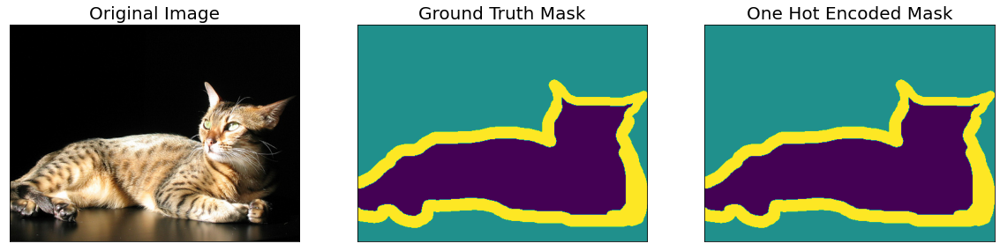

In [24]:
dataset = RoadsDataset(input_img_paths, annotation_img_paths, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[random_idx]

print(image[:5,:5,0])

ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values)
print(ground_truth_mask.shape)
print(ground_truth_mask[:10,:10,0])

visualize(
    original_image = image,
    ground_truth_mask = reverse_one_hot(mask),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

# Augmentation

In [25]:
def get_training_augmentation():
    train_transform = [
        album.Resize(IMAGE_SIZE, IMAGE_SIZE, p=1),
        album.HorizontalFlip(p=0.5),
        album.ShiftScaleRotate(shift_limit=0, scale_limit=0, rotate_limit=15, p=0.5),
#         album.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
        album.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
        album.Normalize(mean=(0, 0, 0), std=(1, 1, 1)),
    ]
    return album.Compose(train_transform)

def get_validation_augmentation():
    train_transform = [
        album.Resize(IMAGE_SIZE, IMAGE_SIZE, p=1),
        album.Normalize(mean=(0, 0, 0), std=(1, 1, 1)),
    ]
    return album.Compose(train_transform)

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

## Visualize Augmented Image & Mask

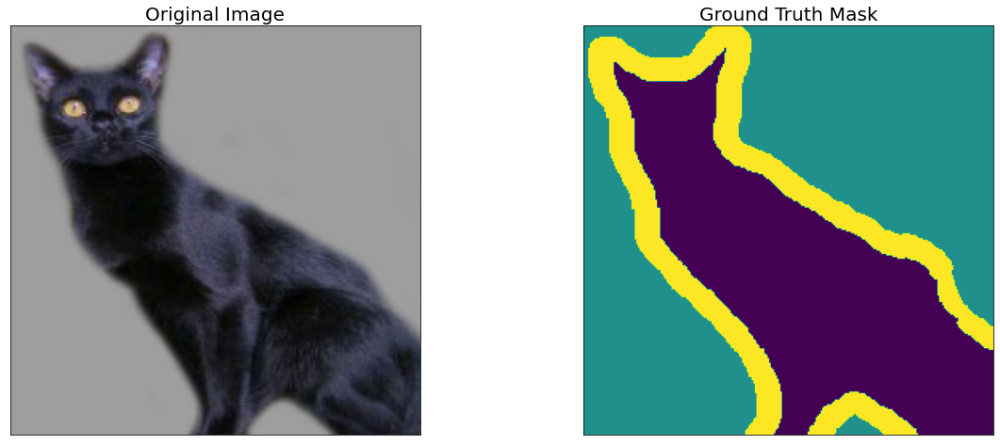

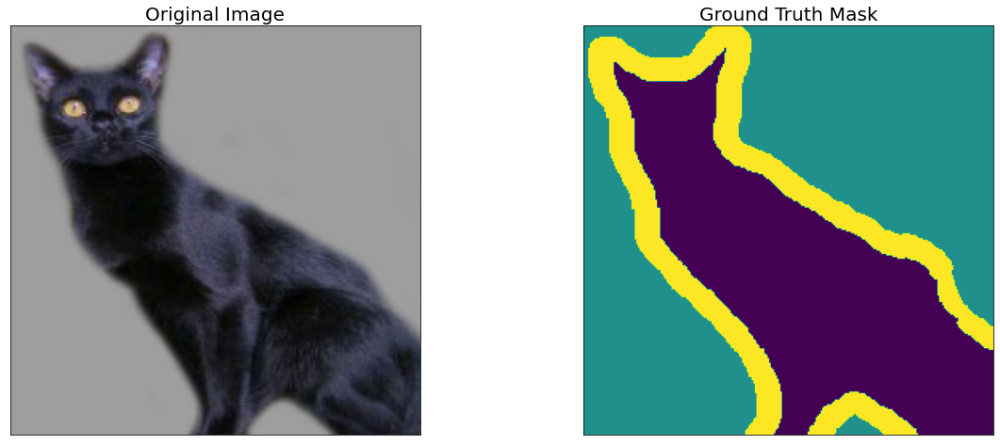

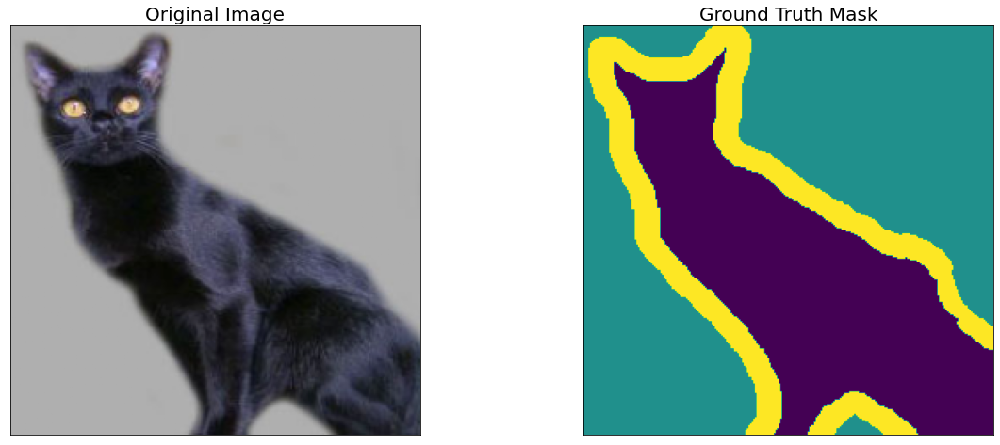

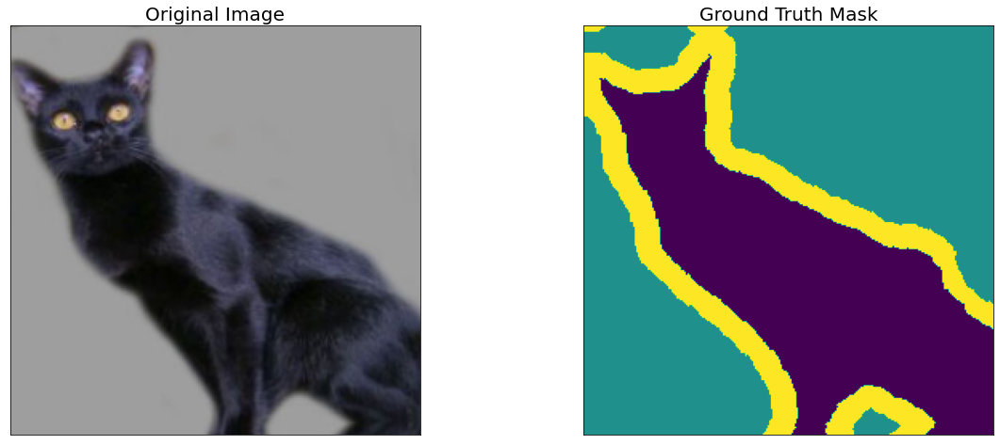

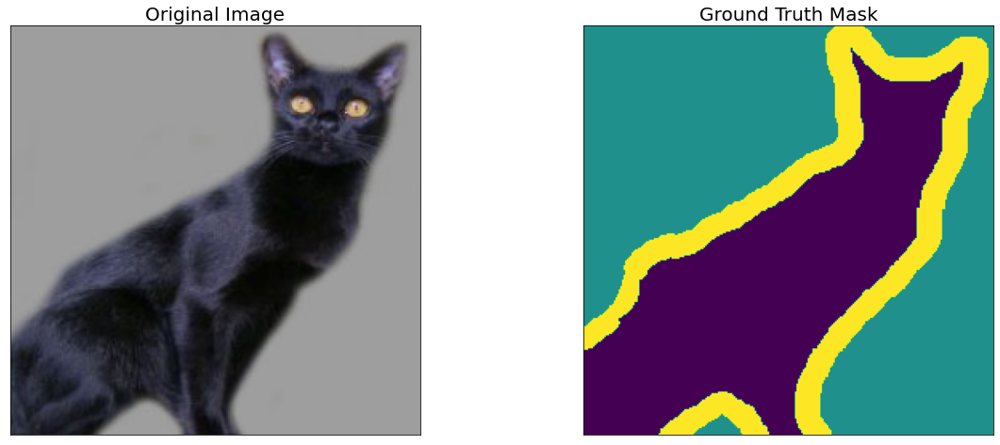

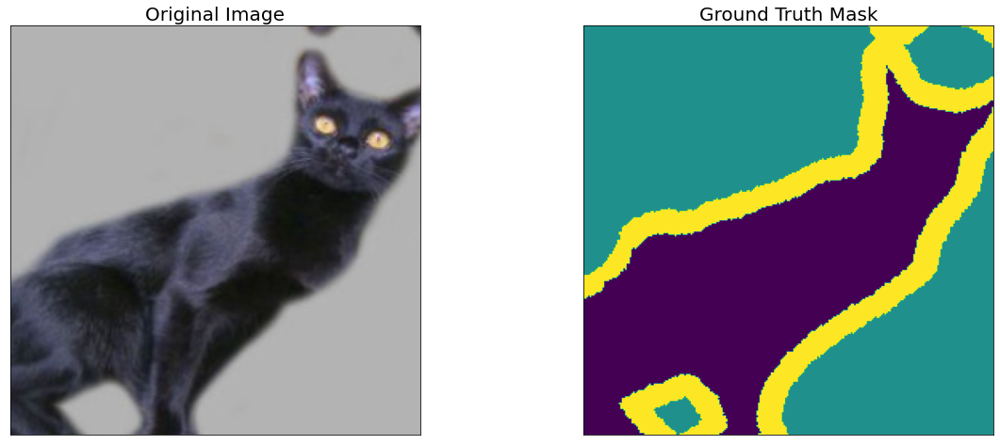

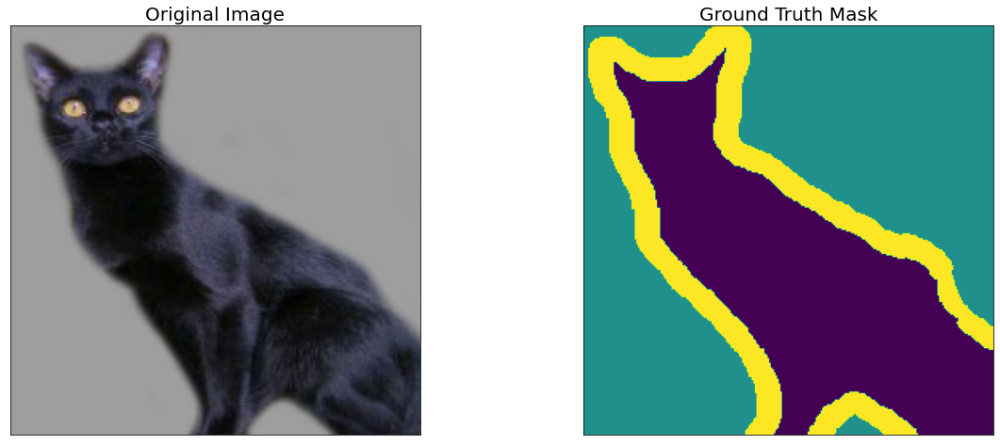

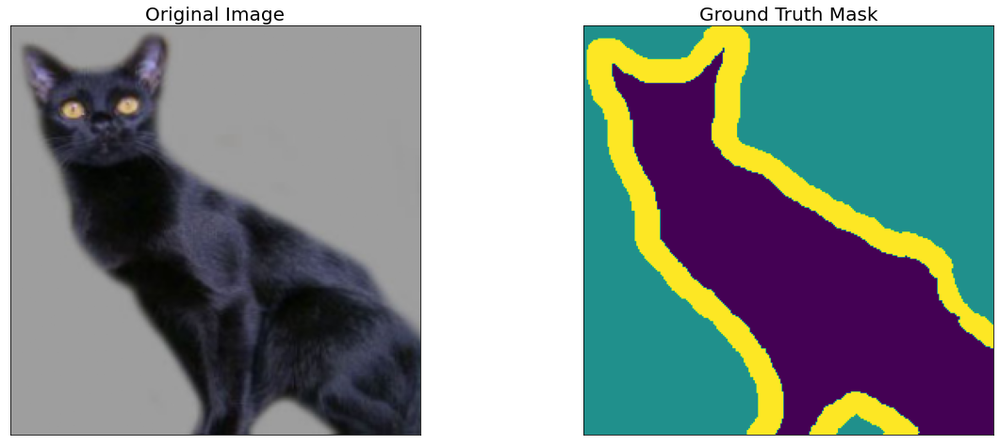

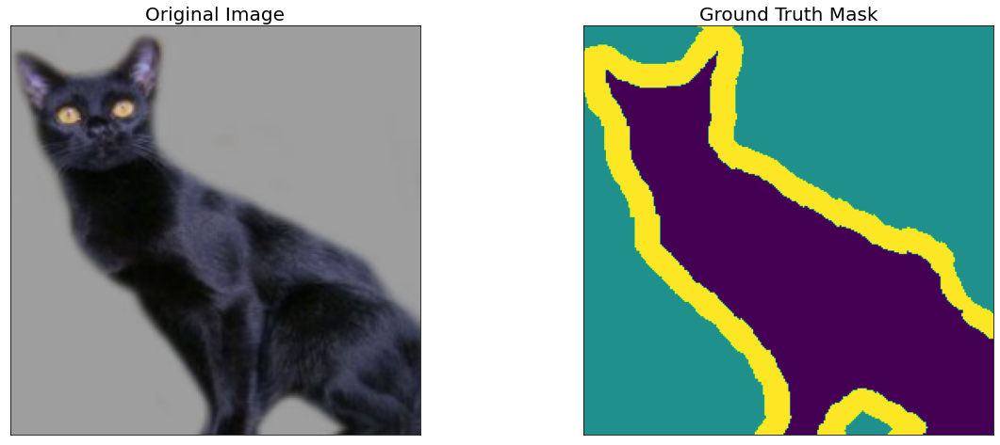

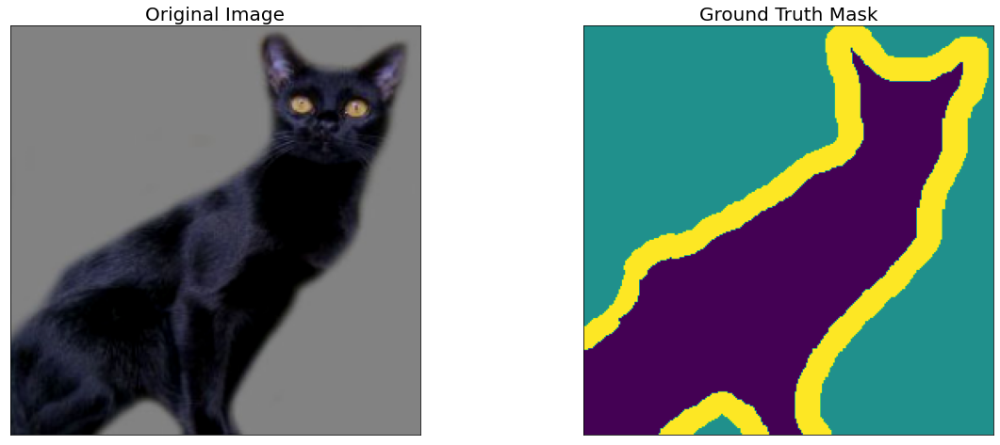

In [26]:
augmented_dataset = RoadsDataset(
    train_img_paths,
    train_label_paths, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

random_idx = random.randint(0, len(augmented_dataset)-1)

# Different augmentations on image/mask pairs
for _ in range(10):
    image, mask = augmented_dataset[random_idx]
    visualize(
        original_image = image,
        ground_truth_mask = reverse_one_hot(mask)
    )

# Training Unet

![alt text](deeplabv3+_architecture.png "DeepLabV3+ Model Architecture")

## Model Definition

In [27]:
CLASSES = select_classes
print(CLASSES)

['object', 'background', 'edge']


In [28]:
# create segmentation model with pretrained encoder
model = smp.Unet(
    encoder_name='mobilenet_v2', 
    encoder_weights='imagenet', 
    classes=len(CLASSES), 
    activation='sigmoid',
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


  0%|          | 0.00/13.6M [00:00<?, ?B/s]

## Get Train/Val Data Loaders

In [29]:
# Get train and val dataset instances
train_dataset = RoadsDataset(
    train_img_paths,
    train_label_paths,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = RoadsDataset(
    val_img_paths,
    val_label_paths,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# Get train and val data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


## Set Hyperparams

In [30]:
import segmentation_models_pytorch.utils.losses
import segmentation_models_pytorch.utils.metrics

In [31]:
# define loss function
loss = segmentation_models_pytorch.utils.losses.DiceLoss()

# define metrics
metrics = [
    segmentation_models_pytorch.utils.metrics.Accuracy(),
    segmentation_models_pytorch.utils.metrics.Recall(),
    segmentation_models_pytorch.utils.metrics.Precision(),
    segmentation_models_pytorch.utils.metrics.Fscore(),
    segmentation_models_pytorch.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

# load best saved model checkpoint from previous commit (if present)
# if os.path.exists('../oxford-iiit-pet-dataset/model.pth'):
    # model = torch.load('../oxford-iiit-pet-dataset/model.pth', map_location=DEVICE)
    # print('Loaded pre-trained DeepLabV3+ model!')

In [32]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    verbose=True,
)

## Define learning rate scheduler

In [33]:
class CosineAnnealingWarmRestarts:
    def __init__(self, epoch=10, min_lr=1e-4, max_lr=1e-3, T_0=1, T_mult=1):
        self.epoch = epoch
        self.min_lr = min_lr
        self.max_lr = max_lr
        self.T_0 = T_0
        self.T_mult = T_mult

    def calc_lr(self, ep):
        if ep < self.T_0:
            return self.max_lr
        ep = ep - (self.T_0-1)

        if self.T_mult == 1:
            T_cur = ep-1
            T_i = self.epoch - self.T_0
            return self.min_lr + 1/2 * (self.max_lr - self.min_lr) * (1 + np.cos(T_cur/T_i*np.pi))

        def calc_restart_count(e, cnt):
            if e * self.T_mult > ep:
                return cnt
            return calc_restart_count(e * self.T_mult, cnt+1)

        restart_count = calc_restart_count(1, 0)
        T_cur = ep - self.T_mult ** restart_count
        T_i = max(self.T_mult ** restart_count - 1, 1)
    #     print(epoch, restart_count, T_cur, T_i)

        return self.min_lr + 1/2 * (self.max_lr - self.min_lr) * (1 + np.cos(T_cur/T_i*np.pi))

Text(0.5, 1.0, 'T_mult: 2')

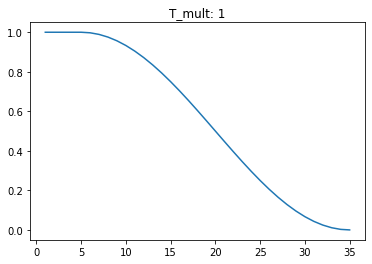

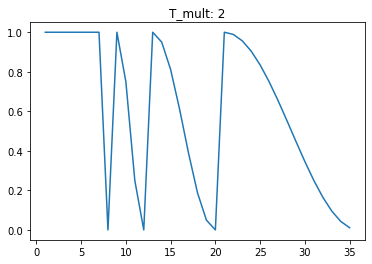

In [34]:
ca = CosineAnnealingWarmRestarts(epoch=35, min_lr=0, max_lr=1, T_0=5, T_mult=1)
a = [ca.calc_lr(i) for i in range(1, 36)]
plt.plot(range(1, len(a)+1), a)
plt.title("T_mult: 1")

ca = CosineAnnealingWarmRestarts(epoch=35, min_lr=0, max_lr=1, T_0=6, T_mult=2)
a = [ca.calc_lr(i) for i in range(1, 36)]
plt.figure()
plt.plot(range(1, len(a)+1), a)
plt.title("T_mult: 2")

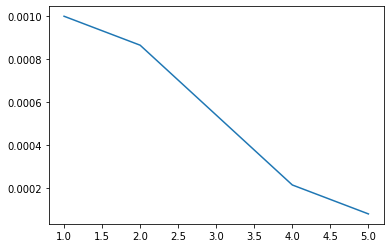

In [35]:
ca_lr_scheduler = CosineAnnealingWarmRestarts(epoch=EPOCHS, min_lr=0.00008, max_lr=LEARNING_RATE, T_0=1, T_mult=1)

a = [ca_lr_scheduler.calc_lr(i) for i in range(1, EPOCHS+1)]
plt.figure()
plt.plot(range(1, len(a)+1), a)

## Training Unet

In [36]:
%%time

if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(1, EPOCHS+1):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))

        lr = ca_lr_scheduler.calc_lr(i)
        print('Learning rate: {}'.format(lr))

        optimizer = torch.optim.Adam([ 
            dict(params=model.parameters(), lr=lr),
        ])

        train_epoch = smp.utils.train.TrainEpoch(
            model, 
            loss=loss, 
            metrics=metrics, 
            optimizer=optimizer,
            verbose=True,
        )

        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, './Unet_model.pth')
            print('Model saved!')


Epoch: 1
Learning rate: 0.001
valid: 100%|██████████| 47/47 [03:35<00:00,  4.59s/it, dice_loss - 0.1295, accuracy - 0.919, recall - 0.8792, precision - 0.8779, fscore - 0.8786, iou_score - 0.7837]
Model saved!

Epoch: 2
Learning rate: 0.0008652691193458119
valid: 100%|██████████| 47/47 [03:27<00:00,  4.41s/it, dice_loss - 0.09127, accuracy - 0.9394, recall - 0.9115, precision - 0.9071, fscore - 0.9093, iou_score - 0.8339]
Model saved!

Epoch: 3
Learning rate: 0.00054
valid: 100%|██████████| 47/47 [03:27<00:00,  4.41s/it, dice_loss - 0.08658, accuracy - 0.9423, recall - 0.916, precision - 0.9114, fscore - 0.9137, iou_score - 0.8414]
Model saved!

Epoch: 4
Learning rate: 0.0002147308806541882
valid: 100%|██████████| 47/47 [03:26<00:00,  4.39s/it, dice_loss - 0.07668, accuracy - 0.9489, recall - 0.9259, precision - 0.9212, fscore - 0.9236, iou_score - 0.8582]
Model saved!

Epoch: 5
Learning rate: 8e-05
valid: 100%|██████████| 47/47 [03:27<00:00,  4.41s/it, dice_loss - 0.07389, accuracy -

# Prediction on Test Data

In [37]:
from google.colab import files

files.download('./Unet_model.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [38]:
# load best saved model checkpoint from the current run
if os.path.exists('./Unet_model.pth'):
    best_model = torch.load('./Unet_model.pth')
    print('Loaded Unet model from this run.')

Loaded Unet model from this run.


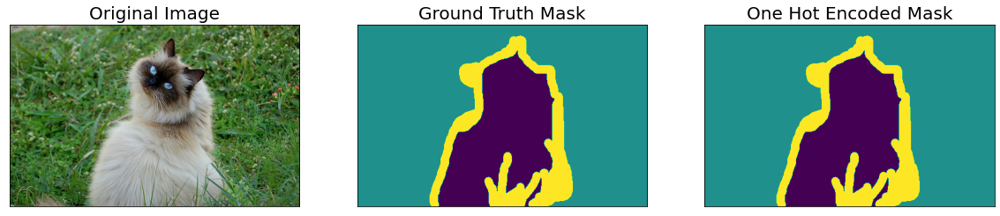

In [39]:
# create test dataloader to be used with DeepLabV3+ model (with preprocessing operation: to_tensor(...))
test_dataset = RoadsDataset(
    test_img_paths,
    test_label_paths,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# test dataset for visualization (without preprocessing augmentations & transformations)
test_dataset_vis = RoadsDataset(
    test_img_paths,
    test_label_paths,
    class_rgb_values=select_class_rgb_values,
)

# get a random test image/mask index
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

visualize(
    original_image = image,
    ground_truth_mask = reverse_one_hot(mask),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [40]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

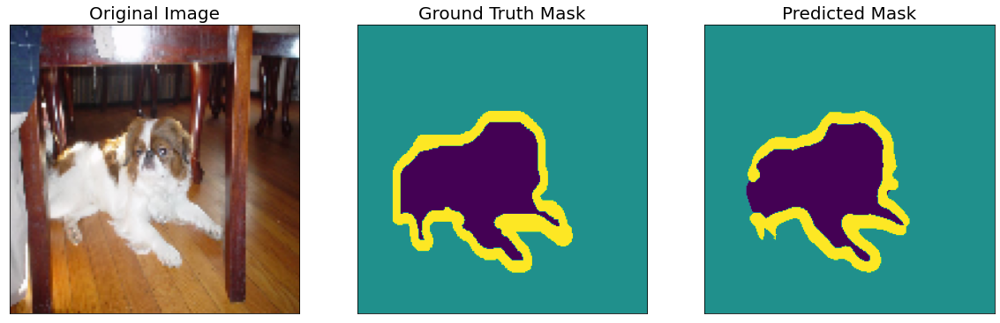

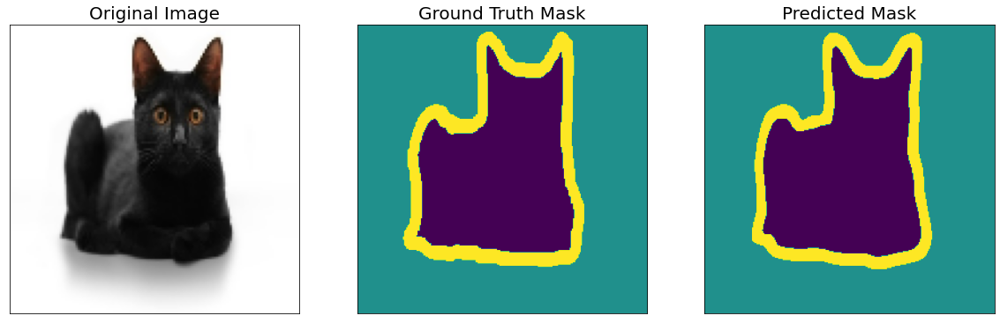

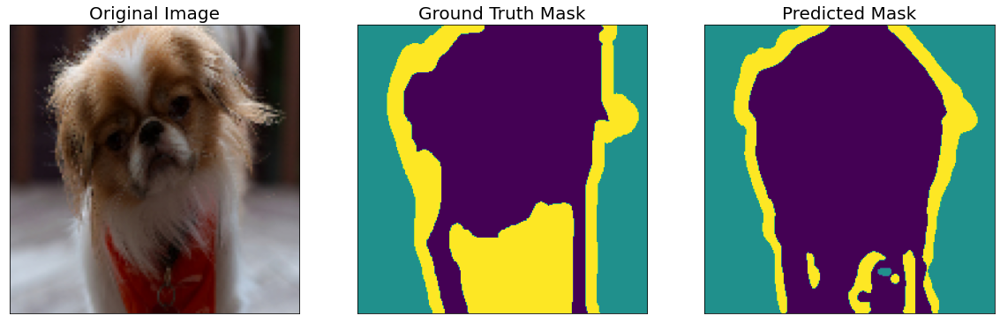

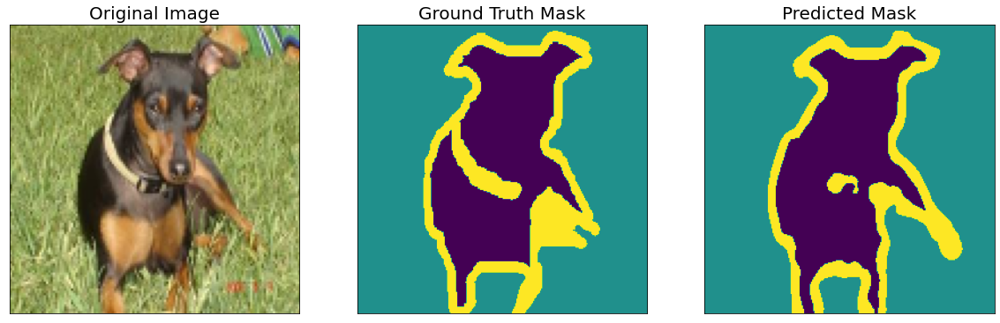

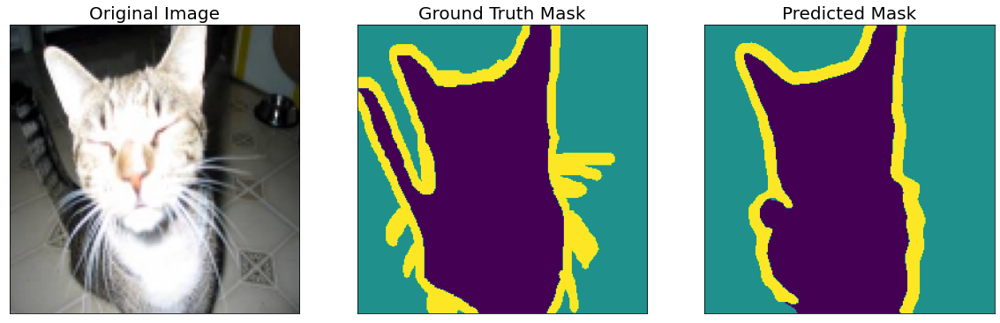

...

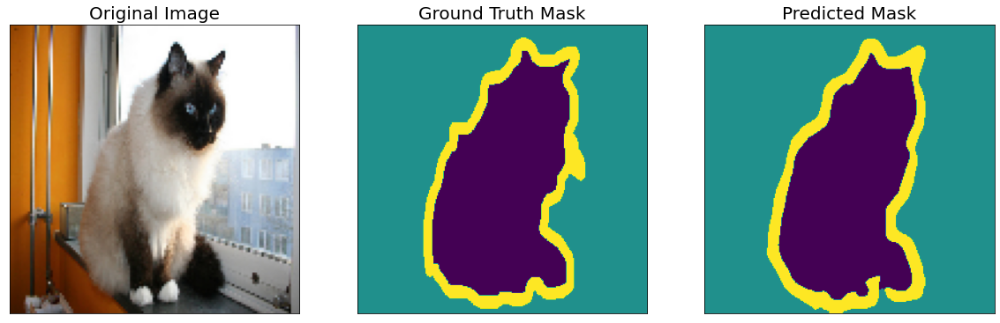

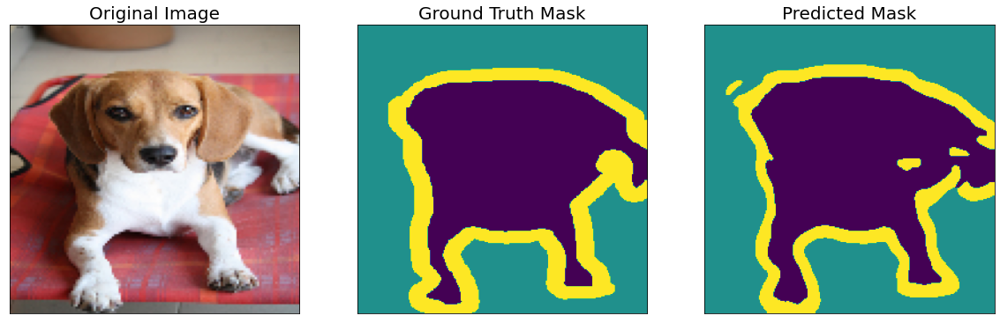

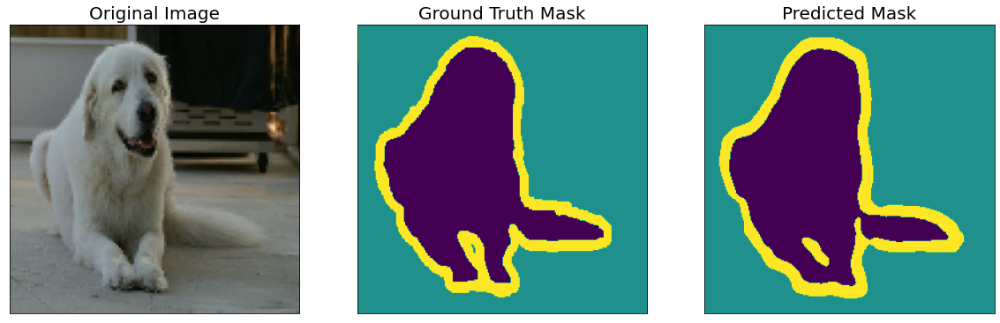

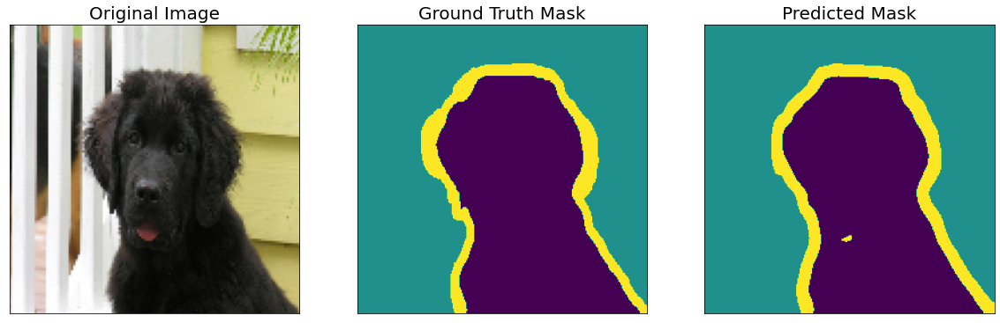

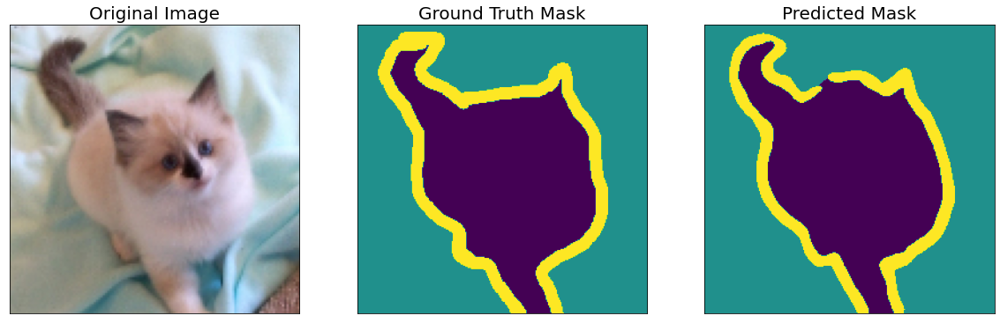

In [41]:
n = 30
idxes = np.random.randint(0,len(test_img_paths),n)
for idx in idxes:
    image, gt_mask = test_dataset[idx]
    image_vis, _ = test_dataset_vis[idx]
    x_tensor = torch.from_numpy(image).unsqueeze(0)
    # Predict test image
    pred_mask = best_model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()

#     print(image_vis.shape, gt_mask.shape, pred_mask.shape)

    # Convert pred_mask from `CHW` format to `HWC` format
    pred_mask = np.transpose(pred_mask,(1,2,0))
    gt_mask = np.transpose(gt_mask,(1,2,0))
    
    visualize(
        original_image = cv2.resize(image_vis, dsize=(128, 128)),
        ground_truth_mask = reverse_one_hot(gt_mask),
        predicted_mask = reverse_one_hot(pred_mask),
    )

# Model Evaluation on Test Dataset


In [42]:
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics, 
    verbose=True,
)

valid_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Accuracy: {valid_logs['accuracy']:.4f}")
print(f"Recall: {valid_logs['recall']:.4f}")
print(f"Precision: {valid_logs['precision']:.4f}")
print(f"F1-Score: {valid_logs['fscore']:.4f}")
print(f"Mean IoU Score: {valid_logs['iou_score']:.4f}")
print(f"Mean Dice Loss: {valid_logs['dice_loss']:.4f}")

valid: 100%|██████████| 1478/1478 [04:00<00:00,  6.14it/s, dice_loss - 0.07285, accuracy - 0.9515, recall - 0.9298, precision - 0.925, fscore - 0.9274, iou_score - 0.8682]
Evaluation on Test Data: 
Accuracy: 0.9515
Recall: 0.9298
Precision: 0.9250
F1-Score: 0.9274
Mean IoU Score: 0.8682
Mean Dice Loss: 0.0729


In [43]:
train_logs_df = pd.DataFrame(train_logs_list)
train_logs_df.T

,0,1,2,3,4
dice_loss,0.182237,0.102229,0.088552,0.078941,0.074414
accuracy,0.911570,0.932943,0.941073,0.947428,0.950449
recall,0.851051,0.901386,0.914222,0.923626,0.928022
precision,0.875396,0.897842,0.909471,0.919058,0.923683
fscore,0.862053,0.899610,0.911840,0.921336,0.925847
iou_score,0.764902,0.817821,0.838162,0.854358,0.862105


In [44]:
valid_logs_df = pd.DataFrame(valid_logs_list)
valid_logs_df.T

,0,1,2,3,4
dice_loss,0.129541,0.091270,0.086579,0.076680,0.073887
accuracy,0.918985,0.939394,0.942337,0.948921,0.950785
recall,0.879192,0.911504,0.916013,0.925937,0.928761
precision,0.877935,0.907127,0.911441,0.921229,0.923987
fscore,0.878563,0.909310,0.913721,0.923577,0.926368
iou_score,0.783663,0.833912,0.841355,0.858167,0.862993


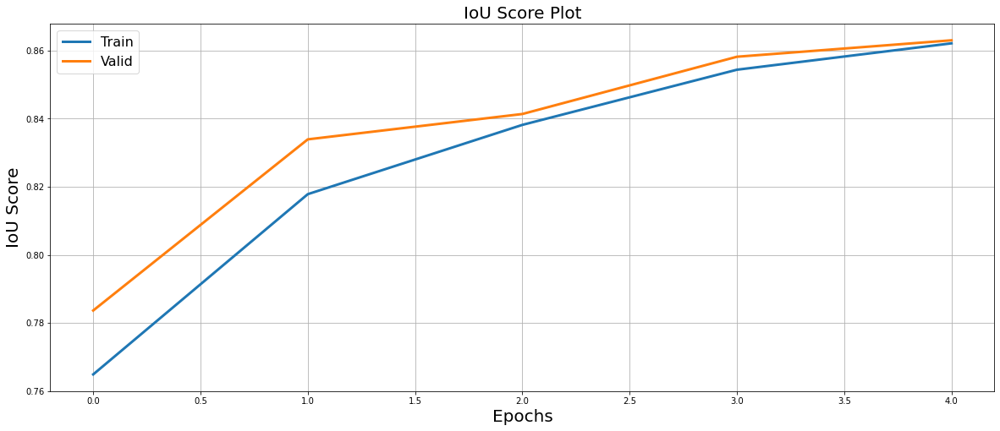

In [45]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.iou_score.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.iou_score.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('IoU Score', fontsize=20)
plt.title('IoU Score Plot', fontsize=20)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

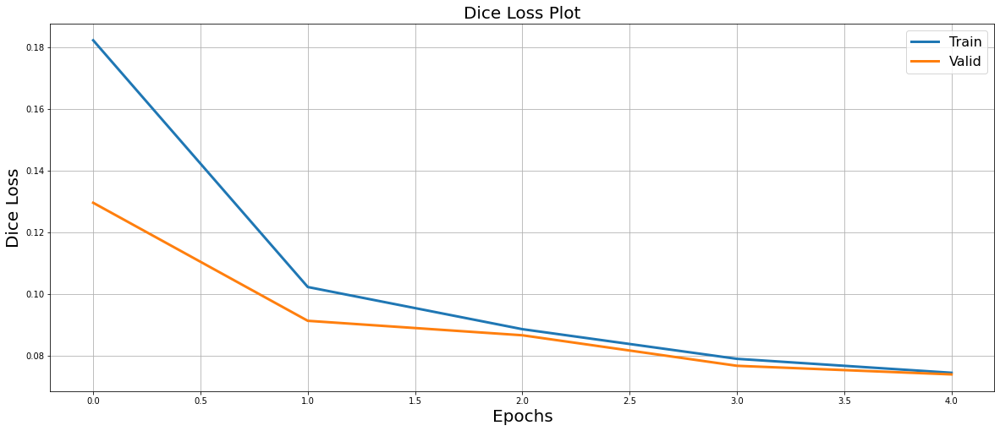

In [46]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.dice_loss.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.dice_loss.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('Dice Loss', fontsize=20)
plt.title('Dice Loss Plot', fontsize=20)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('dice_loss_plot.png')
plt.show()